<a id="top"/>


### Come back to [Home](FinalProjectReport.ipynb)


# STOCK INVESTIGATION

>The content of this section is:
>1. [Preliminary analysis](#firstLook) 
>1. [Which currency got stronger?](#cnyvs)
>1. [Has Donald Trump taken advantage of the pandemic?](#trump)
>1. [Is there any correlation between stock indexes?](#correlation)
>1. [Which strategy benefits the economy most?](#scandinavian)

>Here we import the modules that we will need in order to extract the data to manipulate them 

In [1]:
import pandas as pd
import csv
import seaborn as sns
sns.set()
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.animation as animation
import matplotlib.dates as mdates
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
from IPython.display import HTML
import plotly.express as px
import urllib
from collections import defaultdict
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [2]:
def define_title_axis(fig, title, x, y, z=None):
    if z:
        fig.update_layout(
                    scene = dict(
                    xaxis_title=x,
                    yaxis_title=y,
                    zaxis_title=z),
                    title_x=0.5,
                    width=700,
                    margin=dict(r=20, b=10, l=10, t=10),
                    font=dict(family="Franklin Gothic")
        )
    else:
        fig.update_layout(
            title=title,
            xaxis_title=x,
            yaxis_title=y,
            title_x=0.5,
            font=dict(
                family="Franklin Gothic",
            )
        )

<a id="firstLook"/>

## Preliminary analysis
> In the following section, we perform an initial analysis to identify the most interesting points to be further analyzed.
### How do stocks look at first glance?
> To take a first look at the stock market, we display a line chart for each stock index we previously gathered. These charts show the stock trend from January 2018. Note, as mentioned in the previous pages, the stock value is normalized between 0-1.

In [3]:
df_stock = pd.read_csv("stocks.csv", index_col=0)
df_stock['date'] = pd.to_datetime(df_stock["date"])

In [4]:
def print_one_graph_for_each_stock(df, starting_date = None):
    if not starting_date:
        starting_date = min(df.date)
    print("\nStocks's Trend from %s till %s" % (starting_date.date(), max(df.date).date()))
    ax = sns.relplot(x="date", y="adj_close_norm", col="stock", hue="stock", col_wrap=3, kind='line', data=df[(df.date >= starting_date)])
    ax.fig.autofmt_xdate()
    ax.fmt_xdata = mdates.DateFormatter('%m-%d')
    ax.set(xlabel='Date', ylabel='Normalized Adj Close Value')
    plt.show()


Stocks's Trend from 2017-12-19 till 2020-05-13


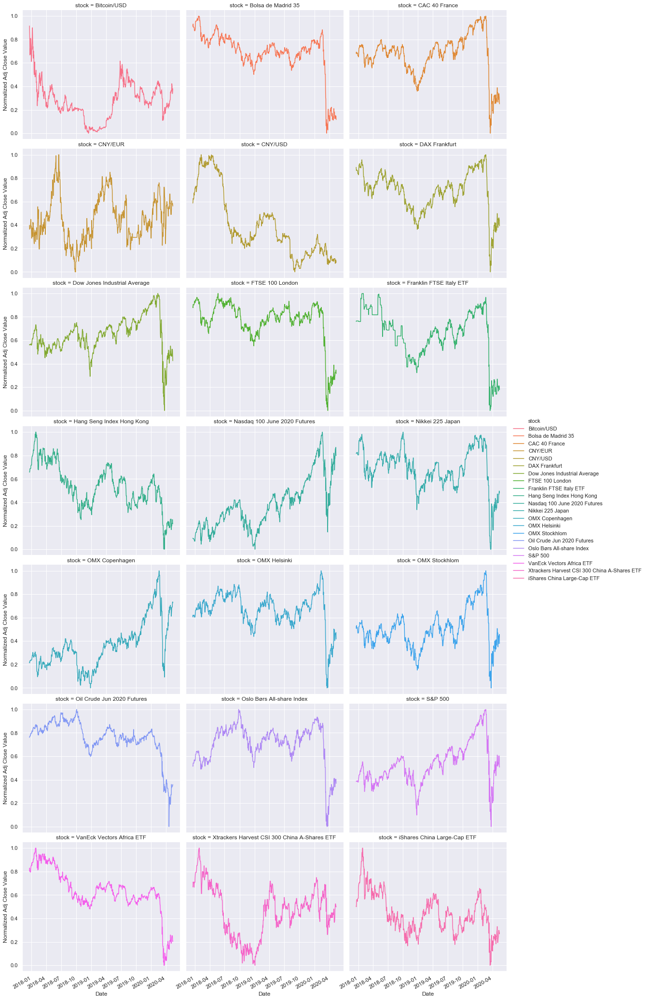

In [5]:
print_one_graph_for_each_stock(df_stock)

### Focus on Covid-19 period
> Here, we repropose the charts above, considering only the coronavirus period instead (from January 2020). 

In [6]:
starting_date = datetime(2020, 1, 1)


Stocks's Trend from 2020-01-01 till 2020-05-13


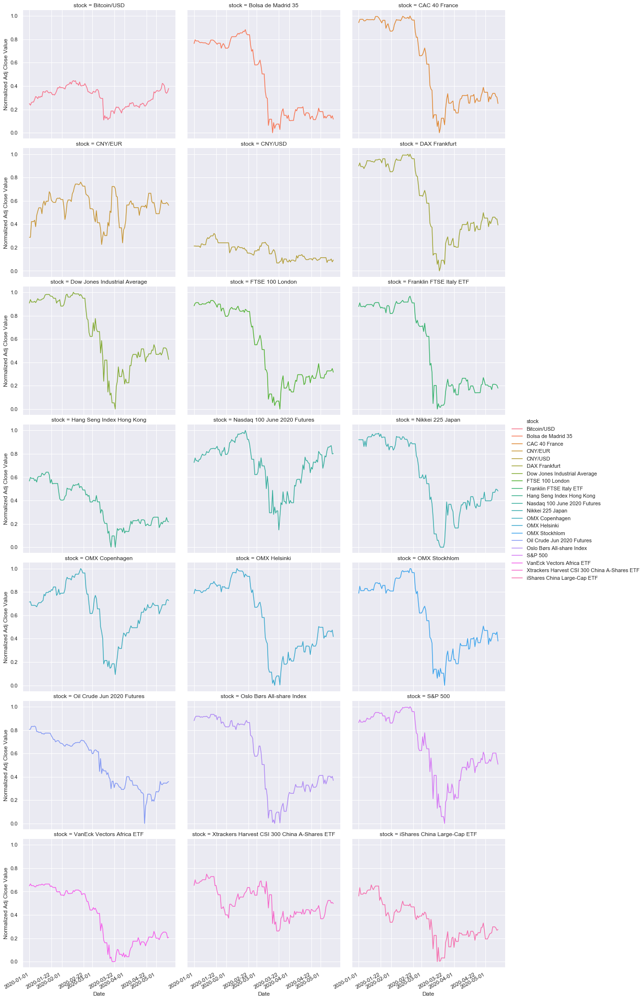

In [7]:
print_one_graph_for_each_stock(df_stock, starting_date)

### Are there any pattern within the months?
> To make sure the drop is due only to the Coronavirus, we align the last three years and we plot them in the same chart. Again, this is done for stock indexes. By doing so, we want to see if indexes have patterns throughout the months of the year. For example, if a certain index tends to increase in the first half of the year, and decrease the second half.

In [8]:
def print_comparison_within_years(df):
    print("\n\nComparison between years\n")
    temp = df.copy()
    temp = temp[temp.date >= datetime(2018,1,1)]
    temp['year'] = temp.date.dt.year
    temp['month-day'] = temp.date.apply(lambda dt: dt.replace(year=1992))
    ax = sns.relplot(x='month-day', y="adj_close_norm", col="stock", hue="year", col_wrap=3, kind='line', data=temp, palette="Paired")
    ax.fig.autofmt_xdate()
    ax.fmt_xdata = mdates.DateFormatter('%m')
    ax.set(xlabel='Month-Day', ylabel='Normalized Adj Close Value')
    plt.show()
    print("Note that we were not able to show only month and day on the x-axe. The year should not be taken into consideration.")



Comparison between years



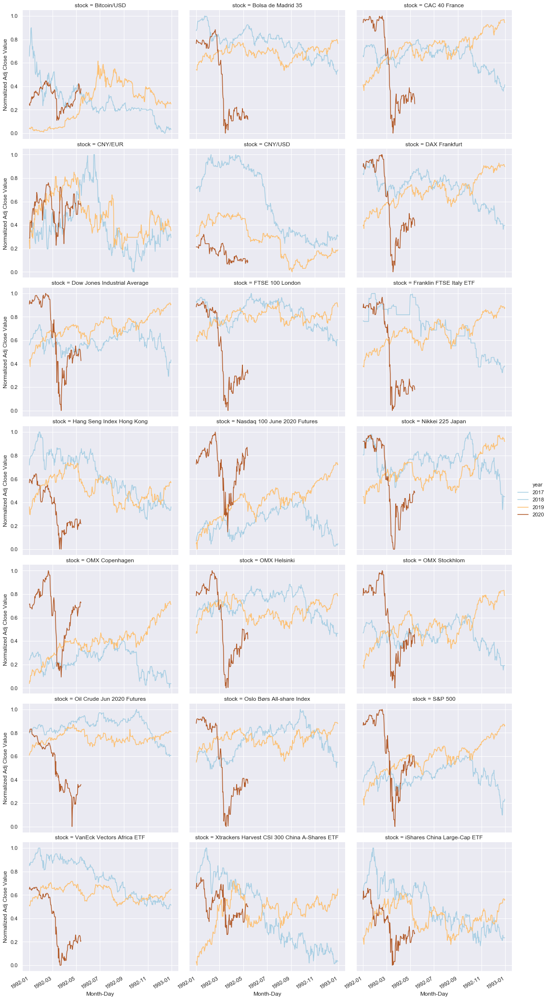

Note that we were not able to show only month and day on the x-axe. The year should not be taken into consideration.


In [9]:
print_comparison_within_years(df_stock)

<a id="allTogether">

### All together
> Finally, we plot all indexes together. The charts below are interactive and allow you to select which indexes to show, as well as the timeframe. Through these graphs, we can easily compare more indexes to identify possible correlations.

In [10]:
def print_all_together(df, starting_date = None, selected_stocks = None):
    if not starting_date:
        starting_date = min(df.date)
    if selected_stocks:
        title = " ,".join(selected_stocks)
    else:
        title = "All together"
    title += " since %s" % starting_date.date()
    fig = px.line(df[(df.date >= starting_date)], x="date", y="adj_close_norm", color='stock')
    define_title_axis(fig, title=title, x="Date", y="Stock")
    fig.update_xaxes(rangeslider_visible=True)
    fig.show()
    fig = px.line_3d(df, x="date", z="adj_close_norm", y="stock", color='stock', width =800, title=title)
    define_title_axis(fig, title=title, x="Date", z="Normalized Adj Close", y="")
    fig.show()

In [34]:
print_all_together(df_stock, datetime(2018, 1, 1))

In [33]:
print_all_together(df_stock, datetime(2020, 1, 1))

In [13]:
def print_basic_graphs(SELECTED_STOCKS, df):
    df_stock_sel = df[df.stock.isin(SELECTED_STOCKS)].reset_index(drop=True)
    print_one_graph_for_each_stock(df_stock_sel)
    print_one_graph_for_each_stock(df_stock_sel, datetime(2020, 1, 1))
    print_comparison_within_years(df_stock_sel)
    print_all_together(df_stock_sel, selected_stocks = SELECTED_STOCKS)
    print_all_together(df_stock_sel, datetime(2020, 1, 1), SELECTED_STOCKS)

### First findings
> Playing with the charts above, several points rise our attention.
* While almost all stocks used to have a clear positive trend before the coronavirus exploded, the Chinese indexes are declining over the last years. The majority of them were reaching their highest just a few days before the first cases appeared. Instead, the Chinese stock market was just above 65% of its maximum. 
* As one may expect, stronger economies seem to have a faster recovery. The Danish market is currently around 70% of its maximum value. Germany regained roughly 50% of its highest value. The US indexes bounced back to 60% of their maximum.
* Comparing the CNY with EUR and USD, it came out that CNY remarkably increased its values in comparison to EUR.

> From these points, as well as additional reflections, we decided to further delve into the following points. 
* Compare CNY with EUR and USD. Which currency got stronger from the pandemic?
* Analyze Donal Trump's approval estimates in comparison with USA's indexes. Is the virus helping him to get reelected? 
* Study possible correlations among stock indexes. Are there connections between countries?
* Examine different lock-down strategies. What is more beneficial for the economy? Shut everything down or keep it open?

<a id="cnyvs">

## CNY, USD or EUR, which currency got stronger?
> To analyze how the currencies has evolved throughout the pandemic, we displayed several charts showing their trends from different perspective. 

In [14]:
SELECTED_STOCKS = ["CNY/EUR", "CNY/USD", 'iShares China Large-Cap ETF']


Stocks's Trend from 2017-12-19 till 2020-05-13


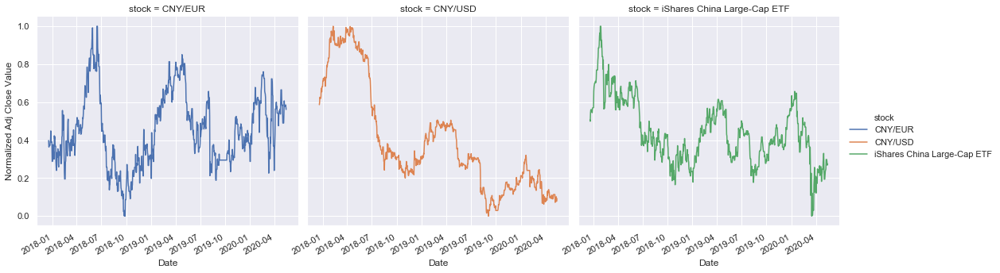


Stocks's Trend from 2020-01-01 till 2020-05-13


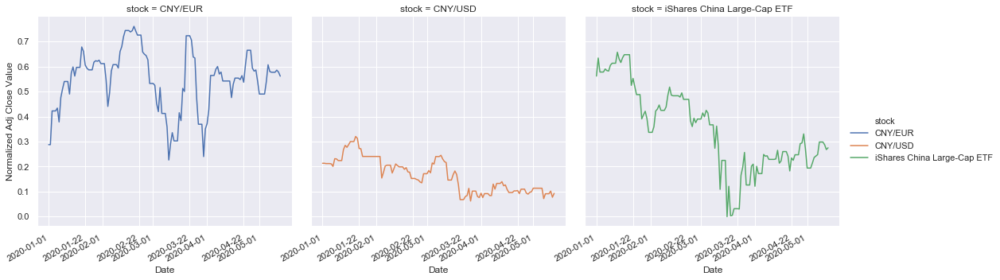



Comparison between years



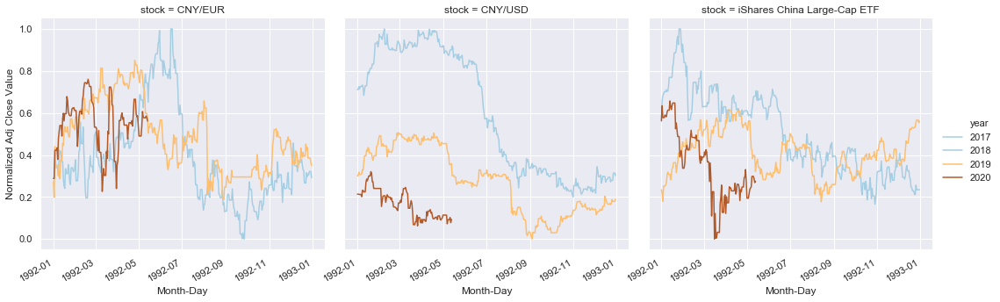

Note that we were not able to show only month and day on the x-axe. The year should not be taken into consideration.


In [15]:
print_basic_graphs(SELECTED_STOCKS, df_stock)

### Results
> Initially, CNY significantly increases against EUR over the period. Precisely, it closes 92% higher compared to the initial value. This suggests that investors have a stronger belief in the Chinese economy rather than the European ecosystem. Furthermore, it shows that the Chinese markets are more attractive to capital. This allows CNY holders to enact dominance in the European market. Conversely, this is not reflected on the CNY/USD pair which remains stable throughout the period. Lastly, the Chinese market, seen through the iShares China Large-Cap ETF, shows a quick recovery. Specifically, it has regained approximately 50% of its former value, hinting what recovery could look like in the West after the containment of Covid-19.

<a id="trump">

## Has Donald Trump taken advantage of the virus?
> To assess whether Donald Trump has actually exploited the pandemic to get reelected, we initially plot the main US' indexes. 

In [16]:
SELECTED_STOCKS = ['Dow Jones Industrial Average', 'S&P 500']


Stocks's Trend from 2017-12-19 till 2020-05-13


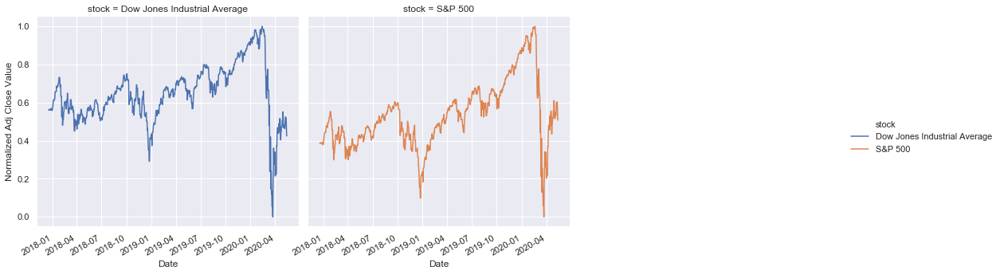


Stocks's Trend from 2020-01-01 till 2020-05-13


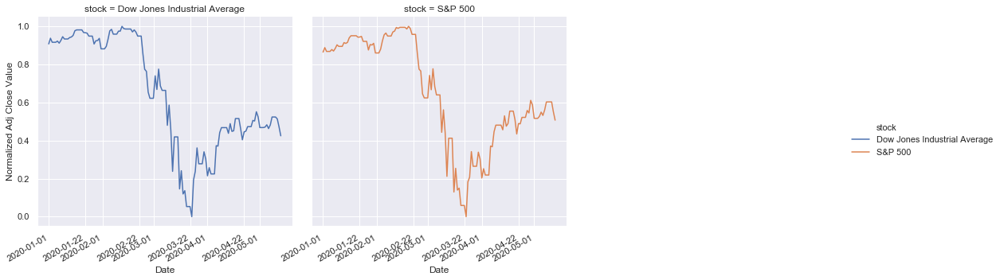



Comparison between years



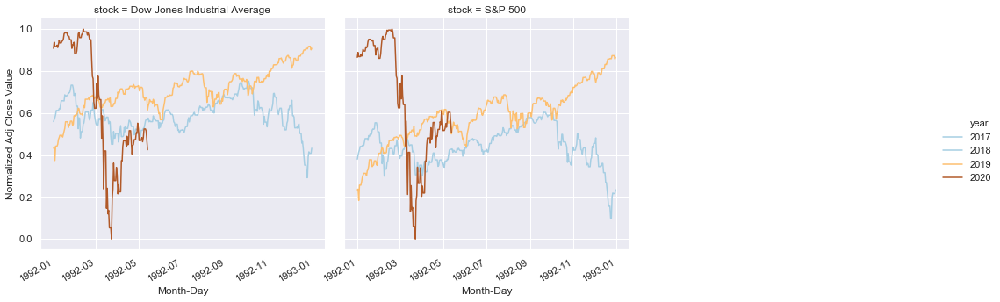

Note that we were not able to show only month and day on the x-axe. The year should not be taken into consideration.


In [17]:
print_basic_graphs(SELECTED_STOCKS, df_stock)

> Then, we load the dataset containinig information about its approval ratings throughout the last three years. Thus, we plot them in comparison with the stock indexes mentioned above. 

In [18]:
link = "https://projects.fivethirtyeight.com/trump-approval-data/approval_topline.csv"
with urllib.request.urlopen(link) as url:
    trump_df = pd.read_csv(url)

trump_df['timestamp'] = pd.to_datetime(trump_df["timestamp"])
trump_df.head(2)

,president,subgroup,modeldate,approve_estimate,approve_hi,approve_lo,disapprove_estimate,disapprove_hi,disapprove_lo,timestamp
0,Donald Trump,Voters,5/14/2020,44.292958,48.463108,40.122807,51.981953,55.804223,48.159684,2020-05-14 14:36:16
1,Donald Trump,Adults,5/14/2020,43.279756,46.836251,39.723260,51.975325,57.108743,46.841907,2020-05-14 14:34:41


In [19]:
fig = px.line(trump_df, x="timestamp", y="approve_estimate", color='subgroup')
define_title_axis(fig, title='Trump since %s' % starting_date.date(), x="Date", y="Approve Estimate")
fig.update_layout(legend_orientation="h",legend=dict(x=0, y=1.1))
fig.show()

In [20]:
temp_trump_df = trump_df[trump_df.subgroup == 'All polls']
SELECTED_STOCKS = ['Dow Jones Industrial Average', 'S&P 500']
temp_stock  = df_stock[df_stock.stock.isin(SELECTED_STOCKS)].reset_index(drop=True)

starting_date = max(min(temp_stock.date), min(temp_trump_df.timestamp))

temp_trump_df = temp_trump_df[temp_trump_df.timestamp >= starting_date]
temp_stock = temp_stock[temp_stock.date >= starting_date]

In [21]:
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])
define_title_axis(fig, title="", x="", y="")
# Add traces
fig.add_trace(
    go.Scatter(x=temp_trump_df.timestamp, y=temp_trump_df.approve_estimate, name='Trump Approve'),
    secondary_y=False,
)

for stock in SELECTED_STOCKS:
    temp_temp_stock = temp_stock[temp_stock.stock == stock]
    fig.add_trace(
        go.Scatter(x=temp_temp_stock.date, y=temp_temp_stock.adj_close_norm, name=stock),
        secondary_y=True,
    )

# Add figure title
fig.update_layout(
    title_text="Trump vs Companies from %s" % starting_date.date()
)

# Set x-axis title
fig.update_xaxes(title_text="Date")

# Set y-axes titles
fig.update_yaxes(title_text="Trump Estimate Approval %", secondary_y=False)
fig.update_yaxes(title_text="Normalized Adjust Closed", secondary_y=True)

fig.update_layout(legend_orientation="h",legend=dict(x=0, y=1.1))
fig.show()

### Results
> The first charts show that the US economy reached its highest and lowest ever peak over the last three years. Despite that, the two robust indexes, DJI and S&P, regained roughly 60% of their value. This suggests a faster recovery when compared to the Chinese markets. However, the most interesting point regards Donal Trump's approval estimates. During the analyzed period, Trump's approval rating soared to its highest level since the start of his presidency. Regardless of the controversial actions he has made during the period, see the website for more details, data clearly show he has taken great advantage of the pandemic.

<a id="correlation">

### Is there any correlation between stock indexes?
> To find out if there any correlation among the stock markets, we first did some preprocessing. Then, we built a correlation matrix among all indexes.

In [22]:
matrix = df_stock[['date','stock','adj_close']].groupby(['date','stock']).mean().unstack()
matrix.columns = matrix.columns.droplevel()
matrix.head(2)

stock,Bitcoin/USD,Bolsa de Madrid 35,CAC 40 France,CNY/EUR,CNY/USD,DAX Frankfurt,Dow Jones Industrial Average,FTSE 100 London,Franklin FTSE Italy ETF,Hang Seng Index Hong Kong,...,Nikkei 225 Japan,OMX Copenhagen,OMX Helsinki,OMX Stockhlom,Oil Crude Jun 2020 Futures,Oslo Børs All-share Index,S&P 500,VanEck Vectors Africa ETF,Xtrackers Harvest CSI 300 China A-Shares ETF,iShares China Large-Cap ETF
date,,,,,,,,,,,,,,,,,,,,,
2017-12-19,17776.699219,10234.299805,5382.910156,0.12811,0.15119,13215.790039,24754.750000,7544.100098,23.585354,29253.660156,...,22868.000000,1343.479980,3944.669922,1611.430054,57.459999,889.570007,2681.469971,22.367506,29.838703,42.663475
2017-12-20,16624.599609,10207.700195,5352.770020,0.12772,0.15140,13069.169922,24726.650391,7525.200195,23.632223,29234.089844,...,22891.720703,1339.890015,3920.409912,1600.290039,58.090000,889.030029,2679.250000,22.699835,29.946283,42.551884


In [23]:
matrix_trump = temp_trump_df[['approve_estimate','timestamp']]
matrix_trump.loc[:,'timestamp'] = matrix_trump['timestamp'].dt.date
matrix = pd.merge(matrix_trump.groupby('timestamp').mean(), matrix, how='inner', left_index=True, right_index=True, sort=True)
matrix.head(2)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:494: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,approve_estimate,Bitcoin/USD,Bolsa de Madrid 35,CAC 40 France,CNY/EUR,CNY/USD,DAX Frankfurt,Dow Jones Industrial Average,FTSE 100 London,Franklin FTSE Italy ETF,...,Nikkei 225 Japan,OMX Copenhagen,OMX Helsinki,OMX Stockhlom,Oil Crude Jun 2020 Futures,Oslo Børs All-share Index,S&P 500,VanEck Vectors Africa ETF,Xtrackers Harvest CSI 300 China A-Shares ETF,iShares China Large-Cap ETF
2017-12-19,37.10143,17776.699219,10234.299805,5382.910156,0.12811,0.15119,13215.790039,24754.750000,7544.100098,23.585354,...,22868.000000,1343.479980,3944.669922,1611.430054,57.459999,889.570007,2681.469971,22.367506,29.838703,42.663475
2017-12-20,37.20605,16624.599609,10207.700195,5352.770020,0.12772,0.15140,13069.169922,24726.650391,7525.200195,23.632223,...,22891.720703,1339.890015,3920.409912,1600.290039,58.090000,889.030029,2679.250000,22.699835,29.946283,42.551884


In [24]:
corr_matrix = matrix.corr()

In [25]:
def print_correlation_matrix(df, title):
    fig = px.imshow(df,
                labels=dict(x="Stock", y="Stock", color="Correlation"),
                x=df.columns,
                y=df.columns,
                width=800, 
                height=800,
                zmin=-1,
                zmax=1
               )
    fig.update_layout(
            title=title,
            xaxis_title="Stock",
            yaxis_title="Stock",
            title_x=0.5,
            font=dict(
                family="Franklin Gothic",
            )
        )
    fig.show()

In [26]:
print_correlation_matrix(corr_matrix, "Correlation between stocks")

> Due to the many stock indexes we are analyzing, the current correlation matrix is very hard to read. Hence, we decided to shrink it down filtering out all indexes with an absolute correlation lower than 0.7. To these indexes, we added the Trump's approval estimate.

In [27]:
columns_count_above_threshold = [(col, count) for col, count in corr_matrix[abs(corr_matrix)> 0.7].count().to_dict().items()]
top_n = sorted(columns_count_above_threshold, key=lambda x: x[1], reverse=True)[:5]
top_n = ['approve_estimate'] + [col for col, count in top_n]

In [28]:
top_n_matrix = corr_matrix[top_n].drop(set(corr_matrix.columns).difference(top_n))

In [29]:
print_correlation_matrix(top_n_matrix, "Trump's Approval Ratings and the European Markets")

In [30]:
import plotly.figure_factory as ff
figure = ff.create_scatterplotmatrix(
    matrix[top_n],
    diag='box',
    width=1000, 
    height=1000,
    title='Correlation between Trump Approval and Stocks'
)
figure.update_layout(
            title_x=0.5,
            font=dict(
                family="Franklin Gothic",
            )
        )
figure.show()

### Results
> As a result of the filtering process, the remaining indexes are Trump's approval rating, Bolsa de Madrid 35, CAC 40 France, FTSE 100 London, FTSE Italy, and Nikkei 225 Japan. The final correlation matrix shows a high correlation among all indexes except for Trump's approve estimate. Considering that 4 out of 5 indexes are from Europe (France, Italy, Spain, and United Kingdom), this result does not come as a surprise. Although Italy and Spain registered a significantly higher number of cases (especially in the beginning), they all experienced a similar trend of cases within the same timeframe. As such, the corresponding markets followed a resemblant path. Lastly, Trump's approval rating shows a negative correlation when compared with the other indexes, albeit noticeably weaker. 

<a id="scandinavian">

## Which strategy benefits the economy most?
> To fairly analyze which strategy worked out best for the economy, we selected the main stock index for Denmark, Finland, Norway, and Sweden. We chose Scandinavian countries as they all have comparable economies, similar cultures, and geographical areas. Moreover, they share different lock-down strategies. Denmark, Finland, and Norway applied stricter rules, contrary to Sweden.

In [31]:
SELECTED_STOCKS = ['OMX Stockhlom','OMX Helsinki','Oslo Børs All-share Index','OMX Copenhagen']


Stocks's Trend from 2017-12-19 till 2020-05-13


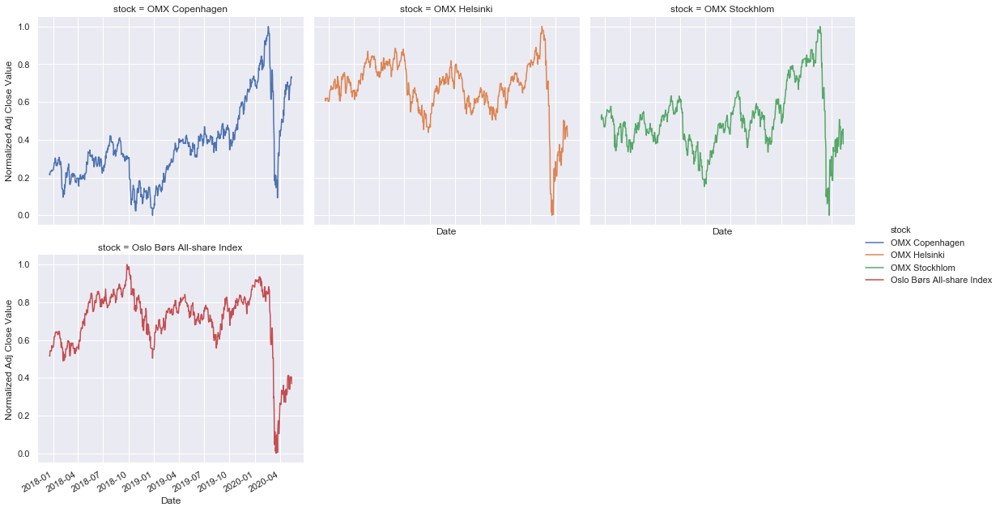


Stocks's Trend from 2020-01-01 till 2020-05-13


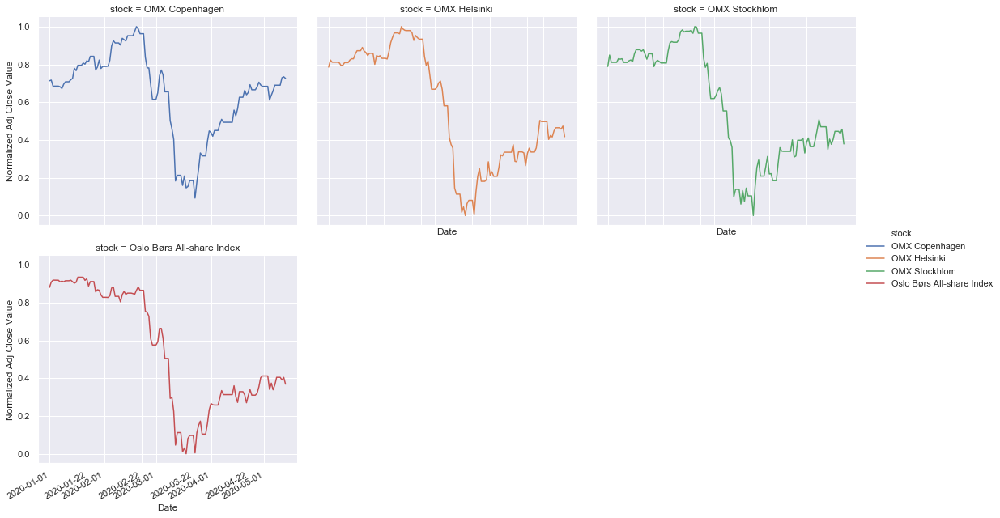



Comparison between years



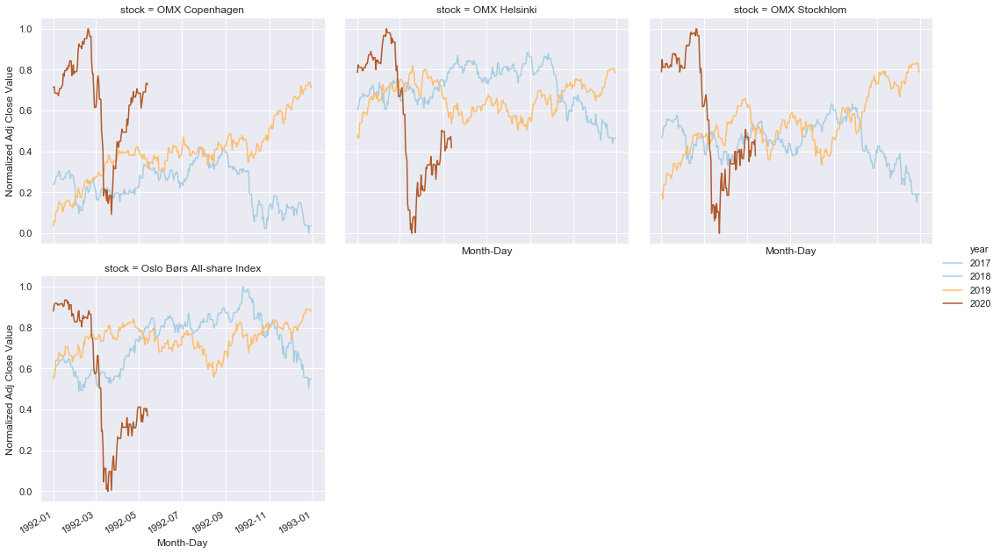

Note that we were not able to show only month and day on the x-axe. The year should not be taken into consideration.


In [32]:
print_basic_graphs(SELECTED_STOCKS, df_stock)

### Results
> All countries saw comparable trends and recovery rates, with Denmark rallying an astonishing 68%. This causes disbelief over the Swedish approach. Indeed, the mortality rate is more than 12% for Sweden, compared to 4% for Finland, 5% for Denmark, and 2.5% for Norway. Moreover, Sweden had almost triple the cases that the mean of the rest Scandinavian countries. Ultimately, the Swedish market recovery suggests that investors do not feel confident that Sweden's policy works best.

#### Come back to the [Back to the top](#top)

#### Come back to [Home](FinalProjectReport.ipynb)